# **Displacement and Housing Burden in Los Angeles County**
## *A group project by Bryzen Morales, Elizabeth Shin, Gina Ranieri, and Leo Blain*

![Image of wildfire](../images/palisades_fire.jpg)

([Image source](https://apnews.com/article/california-pacific-palisades-wildfires-los-angeles-4b67b7f29d0d6eb7321a52ef60c17d60))

The recent Los Angeles wildfires have displaced thousands of people, creating a sudden surge in demand for long-term rental housing–just as supply has drastically shrunk. According to [Strategic Actions for a Just Economy](https://inthesetimes.com/article/price-gouging-wildfires-los-angeles-landlords), many landlords have taken advantage of this crisis by illegally inflating rental prices across the city. While some displaced residents—such as wealthy homeowners from Pacific Palisades—may be able to absorb these costs, many others cannot.

**Rental price gouging will disproportionately harm economically and demographically vulnerable populations, further deepening inequalities across Los Angeles County. This project aims to identify the communities most vulnerable to displacement and housing burden in Los Angeles County.**



## 1. Research Question and Background Information

### 1.1 Research Question

The question guiding our research for this project is **"who were the most vulnerable to displacement/housing burden (age, race, income, housing unit type, etc.) prior to the Los Angeles wildfires?"**

We will use our findings from this project to guide our final project, where we hope to explore **how proximity to wildfire impacts price gouging in Los Angeles county.**

### 1.2 Housing Burden

In the [California Environmental Justice Alliance (CEJA) CalEnviroScreen tool](https://oehha.ca.gov/calenviroscreen/indicator/housing-burden), *housing burden* is defined as the fraction of **low-income** households in a census tract that spend **more than half** of their income on housing.

In this instance, we will be using the US Census Bureau API to extract American Community Survey data. 

#### **Data Extraction and Organizing**

In [2]:
# importing modules

! pip install Census
! pip install us

import matplotlib.pyplot as plt
import pandas as pd
import geopandas as gpd
from census import Census
from us import states
import os
import plotly.express as px

In [3]:
# importing census data

c = Census("ef95485bd9d6c9a56f245ed4f2cc2ad96fe5eb1f")

In [4]:
# importing ACS data 

ca_census = c.acs5.state_county_tract(fields = ('NAME', 'B25034_001E', 'B25034_008E', 'B25034_009E', 'B25034_010E', 'B25034_011E'),
                                      state_fips = states.CA.fips,
                                      county_fips = "*",
                                      tract = "*",
                                      year = 2019)

In [58]:
# converting into a pandas data frame

ca_census_df = pd.DataFrame(ca_census)

In [59]:
# inspecting the data frame's properties

ca_census_df.head()

,NAME,B25034_001E,B25034_008E,B25034_009E,B25034_010E,B25034_011E,state,county,tract
0,"Census Tract 5079.04, Santa Clara County, Cali...",1127.0,596.0,371.0,8.0,0.0,06,085,507904
1,"Census Tract 5085.04, Santa Clara County, Cali...",3556.0,511.0,356.0,27.0,64.0,06,085,508504
2,"Census Tract 5085.05, Santa Clara County, Cali...",2022.0,762.0,165.0,0.0,39.0,06,085,508505
3,"Census Tract 5087.04, Santa Clara County, Cali...",3237.0,82.0,289.0,264.0,49.0,06,085,508704
4,"Census Tract 5094.03, Santa Clara County, Cali...",2374.0,869.0,133.0,94.0,47.0,06,085,509403


In [60]:
# creating a string to create a FIPS column 

ca_census_df["GEOID"] = ca_census_df["state"] + ca_census_df["county"] + ca_census_df["tract"]

ca_census_df.tail()

,NAME,B25034_001E,B25034_008E,B25034_009E,B25034_010E,B25034_011E,state,county,tract,GEOID
8052,"Census Tract 1041.08, Los Angeles County, Cali...",1483.0,270.0,317.0,49.0,0.0,06,037,104108,06037104108
8053,"Census Tract 1042.03, Los Angeles County, Cali...",1184.0,123.0,417.0,87.0,68.0,06,037,104203,06037104203
8054,"Census Tract 1042.04, Los Angeles County, Cali...",786.0,185.0,131.0,19.0,6.0,06,037,104204,06037104204
8055,"Census Tract 1044.03, Los Angeles County, Cali...",710.0,45.0,335.0,149.0,44.0,06,037,104403,06037104403
8056,"Census Tract 1044.04, Los Angeles County, Cali...",708.0,57.0,294.0,180.0,27.0,06,037,104404,06037104404


In [68]:
# subsetting the data to only include the state to be in LA

tracts_v2 = ca_census_df[ca_census_df['county']=='037']

In [69]:
# importing CalEnviroScreen 4.0 Housing Burden data

index = gpd.read_file("/home/jovyan/UP221_2025Fire_HousingBurden/MIDTERM/data/index_shp/index.shp")

In [71]:
# merge datasets together

la = pd.merge(pd.merge(index, 
                    tracts_v2,
                   left_on = 'Geo_FIPS',
                   right_on = 'GEOID'), ca_census_df, left_on = 'Geo_FIPS', right_on = 'GEOID')

In [75]:
# converting to geodata frame and specifying the "geometry" column as the "index"

la_gpd_df = gpd.GeoDataFrame(data=la, geometry=la['geometry'])

#### **Housing Burden Analysis**

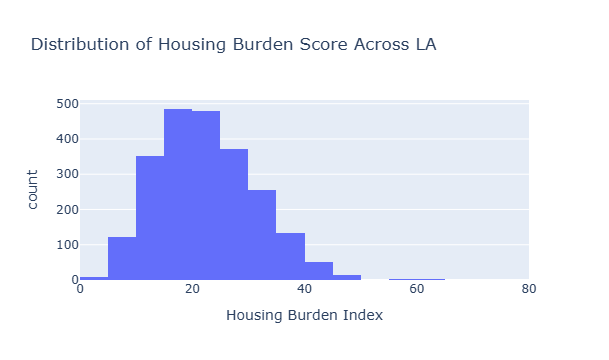

In [76]:
fig = px.histogram(la_gpd_df, 
                   x="Housing Bu", 
                   nbins=20,
                  title = 'Distribution of Housing Burden Score Across LA',
    labels = {
        'Housing Bu' : 'Housing Burden Index',
        'count' : 'Housing Burden Index'})
fig.show()

In [77]:
# find median

la_gpd_df['Housing Bu'].median()

21.75

In [78]:
# find mean

la_gpd_df['Housing Bu'].mean()

np.float64(22.499474145486413)

#### The mean Housing Burden Index is higher than the median, meaning the distribution of housing burden across Los Angeles is skewed right. This can also be seen in the bar chart, with outliers located on the higher end of the index.

## 2. Vulnerability and Housing Burden

### 2.1 Housing Burden and Race

In this section, we will be combining housing burden data with race data from ACS to determine impacted groups.

In [21]:
# import ACS (2015-2019) Race data

race_df = pd.read_csv(
    "/home/jovyan/UP221_2025Fire_HousingBurden/MIDTERM/data/R13799770_SL140.csv",
    dtype=
    {
        'Geo_FIPS':str,
        'Geo_STATE':str,
        'Geo_COUNTY': str
    }
)

In [22]:
race_df.shape

(2346, 70)

In [23]:
race_df.head()

,Geo_FIPS,Geo_GEOID,Geo_NAME,Geo_QName,Geo_STUSAB,Geo_SUMLEV,Geo_GEOCOMP,Geo_FILEID,Geo_LOGRECNO,Geo_US,...,SE_A03001_006,SE_A03001_007,SE_A03001_008,PCT_SE_A03001_002,PCT_SE_A03001_003,PCT_SE_A03001_004,PCT_SE_A03001_005,PCT_SE_A03001_006,PCT_SE_A03001_007,PCT_SE_A03001_008
0,6037101110,14000US06037101110,Census Tract 1011.10,"Census Tract 1011.10, Los Angeles County, Cali...",ca,140,0,ACSSF,3871,NaN,...,3,391,189,78.15,0.44,0.07,7.73,0.07,9.13,4.41
1,6037101122,14000US06037101122,Census Tract 1011.22,"Census Tract 1011.22, Los Angeles County, Cali...",ca,140,0,ACSSF,3872,NaN,...,0,48,67,87.55,2.17,0.44,6.46,0.00,1.41,1.97
2,6037101210,14000US06037101210,Census Tract 1012.10,"Census Tract 1012.10, Los Angeles County, Cali...",ca,140,0,ACSSF,3873,NaN,...,0,921,95,73.22,3.12,0.00,7.66,0.00,14.51,1.50
3,6037101220,14000US06037101220,Census Tract 1012.20,"Census Tract 1012.20, Los Angeles County, Cali...",ca,140,0,ACSSF,3874,NaN,...,0,497,143,71.15,2.35,0.00,9.21,0.00,13.43,3.86
4,6037101300,14000US06037101300,Census Tract 1013,"Census Tract 1013, Los Angeles County, California",ca,140,0,ACSSF,3875,NaN,...,0,45,90,86.25,5.28,0.00,4.99,0.00,1.16,2.32


In [24]:
# drop all columns with empty values

race_df = race_df.dropna(axis=1,how="all")

In [25]:
race_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2346 entries, 0 to 2345
Data columns (total 27 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   Geo_FIPS           2346 non-null   object 
 1   Geo_GEOID          2346 non-null   object 
 2   Geo_NAME           2346 non-null   object 
 3   Geo_QName          2346 non-null   object 
 4   Geo_STUSAB         2346 non-null   object 
 5   Geo_SUMLEV         2346 non-null   int64  
 6   Geo_GEOCOMP        2346 non-null   int64  
 7   Geo_FILEID         2346 non-null   object 
 8   Geo_LOGRECNO       2346 non-null   int64  
 9   Geo_STATE          2346 non-null   object 
 10  Geo_COUNTY         2346 non-null   object 
 11  Geo_TRACT          2346 non-null   int64  
 12  SE_A03001_001      2346 non-null   int64  
 13  SE_A03001_002      2346 non-null   int64  
 14  SE_A03001_003      2346 non-null   int64  
 15  SE_A03001_004      2346 non-null   int64  
 16  SE_A03001_005      2346 

In [26]:
# use codebook to determine columns to keep

columns_to_keep = ['Geo_FIPS',
                   'SE_A03001_001',
                   'SE_A03001_002',
                   'SE_A03001_003',
                   'SE_A03001_004',
                   'SE_A03001_005',
                   'SE_A03001_006',
                   'SE_A03001_007',
                   'SE_A03001_008']
race_df2 = race_df[columns_to_keep]

In [27]:
columns = list(race_df2)
columns

['Geo_FIPS',
 'SE_A03001_001',
 'SE_A03001_002',
 'SE_A03001_003',
 'SE_A03001_004',
 'SE_A03001_005',
 'SE_A03001_006',
 'SE_A03001_007',
 'SE_A03001_008']

In [28]:
# rename columns with accurate descriptions

race_df2.columns = ['Census Tract',
               'Total Population',
               'White Alone',
               'Black or African American Alone',
               'American Indian and Alaska Native Alone',
               'Asian Alone',
               'Native Hawaiian and Other Pacific Islander Alone',
               'Some Other Race Alone',
               'Two or More Races']

In [30]:
# upload Housing Burden dataset

burden_df = pd.read_csv(
    "/home/jovyan/UP221_2025Fire_HousingBurden/MIDTERM/data/Burden_Data.csv",
    dtype=
    {
        'Geo_FIPS':str,
        'Geo_STATE':str,
        'Geo_COUNTY': str
    }
)

In [31]:
# filter data to only show Los Angeles County

burden_df2 = burden_df[burden_df["California County"] == "Los Angeles"]

In [32]:
burden_df2.sample(5)

,Census Tract,Total Population,California County,ZIP,Approximate Location,Longitude,Latitude,CES 4.0 Score,CES 4.0 Percentile,CES 4.0 Percentile Range,...,Linguistic Isolation Pctl,Poverty,Poverty Pctl,Unemployment,Unemployment Pctl,Housing Burden,Housing Burden Pctl,Pop. Char.,Pop. Char. Score,Pop. Char. Pctl
164,6037127210,5838,Los Angeles,91405,Los Angeles,-118.459647,34.206637,65.37,97.93,95-100% (highest scores),...,94.42,44.3,75.11,12.0,92.19,19.5,60.93,84.11,8.73,96.08
874,6037572400,1425,Los Angeles,90810,Long Beach,-118.210838,33.824855,51.08,88.98,85-90%,...,11.27,33.1,58.79,11.2,90.33,21.7,69.46,66.88,6.94,75.71
6214,6037574000,5165,Los Angeles,90808,Long Beach,-118.101739,33.814474,13.49,21.66,20-25%,...,19.87,7.7,5.55,2.5,10.66,6.1,2.79,21.86,2.27,9.67
3888,6037137502,4549,Los Angeles,91364,Los Angeles,-118.597692,34.163452,25.99,50.98,50-55%,...,36.00,23.9,42.41,4.6,39.21,26.1,82.79,39.62,4.11,34.91
1338,6037404600,1394,Los Angeles,91706,Irwindale,-117.963523,34.111914,45.94,83.13,80-85%,...,36.46,27.1,48.73,7.7,73.41,14.4,35.27,47.55,4.93,46.58


In [33]:
# filter to only show necessary columns

burden_df2 = burden_df[burden_df["California County"] == "Los Angeles"][["Census Tract", "California County", "Longitude", "Latitude", "Housing Burden"]]

In [34]:
burden_df2.sample(10)

,Census Tract,California County,Longitude,Latitude,Housing Burden
154,6037204810,Los Angeles,-118.203002,34.028555,33.9
35,6037534202,Los Angeles,-118.161110,33.959603,36.3
4604,6037554516,Los Angeles,-118.067280,33.855314,17.6
1725,6037311801,Los Angeles,-118.306208,34.166161,23.7
4609,6037215102,Los Angeles,-118.345601,34.064991,27.3
2461,6037602404,Los Angeles,-118.348153,33.906025,25.8
2899,6037463102,Los Angeles,-118.080061,34.136843,19.5
5582,6037430721,Los Angeles,-118.041722,34.137802,9.0
4170,6037920106,Los Angeles,-118.673799,34.444486,12.0
6201,6037273800,Los Angeles,-118.451263,33.992710,14.0


In [35]:
race_df2.info(verbose=True, show_counts=True)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2346 entries, 0 to 2345
Data columns (total 9 columns):
 #   Column                                            Non-Null Count  Dtype 
---  ------                                            --------------  ----- 
 0   Census Tract                                      2346 non-null   object
 1   Total Population                                  2346 non-null   int64 
 2   White Alone                                       2346 non-null   int64 
 3   Black or African American Alone                   2346 non-null   int64 
 4   American Indian and Alaska Native Alone           2346 non-null   int64 
 5   Asian Alone                                       2346 non-null   int64 
 6   Native Hawaiian and Other Pacific Islander Alone  2346 non-null   int64 
 7   Some Other Race Alone                             2346 non-null   int64 
 8   Two or More Races                                 2346 non-null   int64 
dtypes: int64(8), object(1)
memory u

In [37]:
# convert both Census Tract data sets to string 

race_df2["Census Tract"]=race_df2["Census Tract"].astype(str)
burden_df2["Census Tract"]=burden_df2["Census Tract"].astype(str)

/tmp/ipykernel_294/1282082268.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  race_df2["Census Tract"]=race_df2["Census Tract"].astype(str)


In [79]:
# merge on Census Tract

race_burden_df = burden_df2.merge(race_df2, on="Census Tract")

In [80]:
race_burden_df.sample(5)

,Census Tract,California County,Longitude,Latitude,Housing Burden,Total Population,White Alone,Black or African American Alone,American Indian and Alaska Native Alone,Asian Alone,Native Hawaiian and Other Pacific Islander Alone,Some Other Race Alone,Two or More Races
1997,6037265410,Los Angeles,-118.464417,34.066976,14.4,1495,1268,0,0,145,0,35,47
528,6037128400,Los Angeles,-118.458852,34.176549,16.7,4502,2971,369,0,374,0,676,112
573,6037576200,Los Angeles,-118.186764,33.772384,31.0,5324,2619,1077,208,361,38,704,317
818,6037203720,Los Angeles,-118.203150,34.046894,29.2,4072,2258,0,142,22,114,1452,84
991,6037212900,Los Angeles,-118.321515,34.049454,29.4,4067,1515,459,38,1048,0,924,83


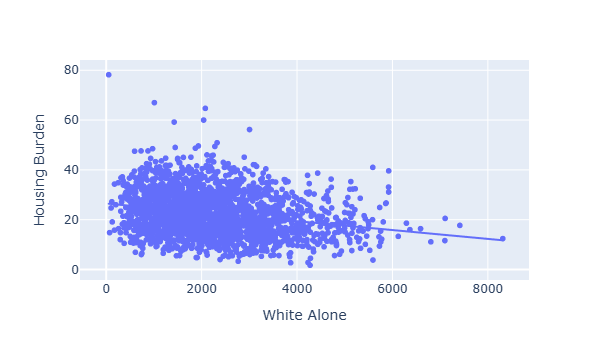

In [81]:
# create scatter plot to show relationship between Housing Burden and "White Alone" population

fig = px.scatter(race_burden_df, x="White Alone", y="Housing Burden", trendline="ols")
fig.show()

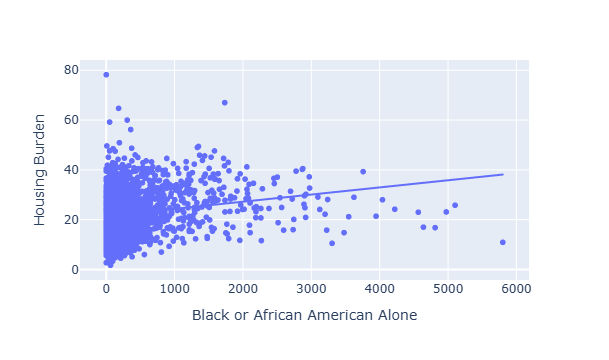

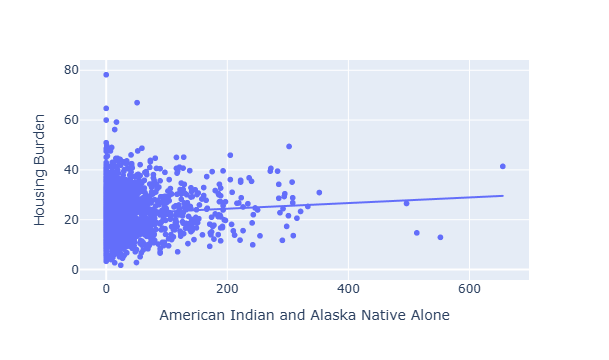

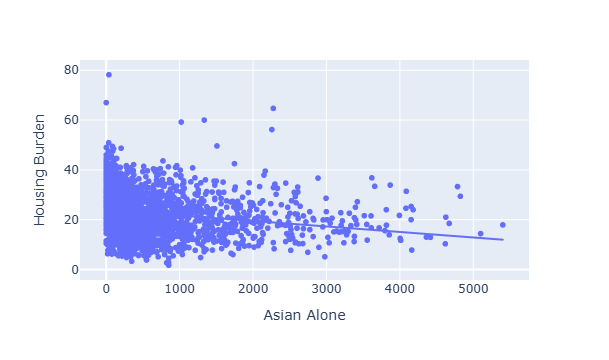

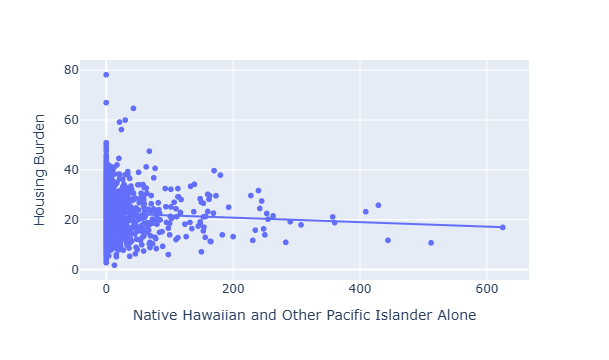

In [82]:
# same for non-white populations

fig = px.scatter(race_burden_df, x="Black or African American Alone", y="Housing Burden", trendline="ols")
fig.show()

fig = px.scatter(race_burden_df, x="American Indian and Alaska Native Alone", y="Housing Burden", trendline="ols")
fig.show()

fig = px.scatter(race_burden_df, x="Asian Alone", y="Housing Burden", trendline="ols")
fig.show()

fig = px.scatter(race_burden_df, x="Native Hawaiian and Other Pacific Islander Alone", y="Housing Burden", trendline="ols")
fig.show()

#### Based on these scatter plots, **"Black or African American Alone"** and **"American Indian and Alaska Native Alone"** are the only two populations with a positive trend line. For these two groups, as population of the racial group increases, so does housing burden. This suggests that these two groups may be more vulnerable to housing cost burdens.

### 2.2 Age and Housing Burden

In [83]:
# import ACS Census data

age_df = pd.read_csv(
    '/home/jovyan/UP221_2025Fire_HousingBurden/MIDTERM/data/census_age_vacancy.csv',
    dtype=
    {
        'Geo_FIPS':str,
        'Geo_State':str,
        'Geo_County':str
    }
)

In [84]:
age_df.head()

,Geo_FIPS,Geo_GEOID,Geo_NAME,Geo_QName,Geo_STUSAB,Geo_SUMLEV,Geo_GEOCOMP,Geo_FILEID,Geo_LOGRECNO,Geo_STATE,...,PCT_SE_A01001_011,PCT_SE_A01001_012,PCT_SE_A01001_013,SE_A10047_001,SE_A10047_002,SE_A10047_003,SE_A10047_004,PCT_SE_A10047_002,PCT_SE_A10047_003,PCT_SE_A10047_004
0,6037101110,14000US06037101110,Census Tract 1011.10,"Census Tract 1011.10, Los Angeles County, Cali...",ca,140,0,ACSSF,3871,6,...,10.04,5.11,1.82,174,19,0,155,10.92,0.00,89.08
1,6037101122,14000US06037101122,Census Tract 1011.22,"Census Tract 1011.22, Los Angeles County, Cali...",ca,140,0,ACSSF,3872,6,...,12.25,6.43,1.29,84,0,25,59,0.00,29.76,70.24
2,6037101210,14000US06037101210,Census Tract 1012.10,"Census Tract 1012.10, Los Angeles County, Cali...",ca,140,0,ACSSF,3873,6,...,6.18,2.85,0.80,95,30,0,65,31.58,0.00,68.42
3,6037101220,14000US06037101220,Census Tract 1012.20,"Census Tract 1012.20, Los Angeles County, Cali...",ca,140,0,ACSSF,3874,6,...,8.27,6.13,1.70,27,0,0,27,0.00,0.00,100.00
4,6037101300,14000US06037101300,Census Tract 1013,"Census Tract 1013, Los Angeles County, California",ca,140,0,ACSSF,3875,6,...,11.38,7.00,5.82,156,26,54,76,16.67,34.62,48.72


In [85]:
# sum age bucks to "under 18," "18-55," and "over 55"

age_df['Under 18'] = age_df[['SE_A01001_002','SE_A01001_003','SE_A01001_004','SE_A01001_005']].sum(axis=1)
age_df['18 to 54'] = age_df[['SE_A01001_006','SE_A01001_007','SE_A01001_008','SE_A01001_009']].sum(axis=1)
age_df['55 and Over'] = age_df[['SE_A01001_010','SE_A01001_011','SE_A01001_012','SE_A01001_013']].sum(axis=1)

In [86]:
# rename columns of interest

age_df.columns = ['Census Tract',
 'Geo_GEOID',
 'Geo_NAME',
 'Geo_QName',
 'Geo_STUSAB',
 'Geo_SUMLEV',
 'Geo_GEOCOMP',
 'Geo_FILEID',
 'Geo_LOGRECNO',
 'Geo_STATE',
 'Geo_COUNTY',
 'Geo_TRACT',
 'Total Population',
 'SE_A01001_002',
 'SE_A01001_003',
 'SE_A01001_004',
 'SE_A01001_005',
 'SE_A01001_006',
 'SE_A01001_007',
 'SE_A01001_008',
 'SE_A01001_009',
 'SE_A01001_010',
 'SE_A01001_011',
 'SE_A01001_012',
 'SE_A01001_013',
 'PCT_SE_A01001_002',
 'PCT_SE_A01001_003',
 'PCT_SE_A01001_004',
 'PCT_SE_A01001_005',
 'PCT_SE_A01001_006',
 'PCT_SE_A01001_007',
 'PCT_SE_A01001_008',
 'PCT_SE_A01001_009',
 'PCT_SE_A01001_010',
 'PCT_SE_A01001_011',
 'PCT_SE_A01001_012',
 'PCT_SE_A01001_013',
 'Vacant Housing Units',
 'For Rent',
 'For Sale',
 'Other Vacant',
 'Percent for Rent',
 'Percent for Sale',
 'Percent Other',
 'Under 18',
 '18 to 54',
 '55 and Over']

In [87]:
columns_to_keep = ['Census Tract','Total Population','Under 18',
                '18 to 54',
                 '55 and Over',
                   'Vacant Housing Units',
                   'For Rent',
                     'For Sale',
                     'Other Vacant',
                     'Percent for Rent',
                     'Percent for Sale',
                     'Percent Other']

In [88]:
age_df2 = age_df[columns_to_keep]

In [89]:
age_df2.head()

,Census Tract,Total Population,Under 18,18 to 54,55 and Over,Vacant Housing Units,For Rent,For Sale,Other Vacant,Percent for Rent,Percent for Sale,Percent Other
0,6037101110,4283,874,2078,1331,174,19,0,155,10.92,0.00,89.08
1,6037101122,3405,429,1603,1373,84,0,25,59,0.00,29.76,70.24
2,6037101210,6347,1480,3462,1405,95,30,0,65,31.58,0.00,68.42
3,6037101220,3702,751,1766,1185,27,0,0,27,0.00,0.00,100.00
4,6037101300,3884,439,1625,1820,156,26,54,76,16.67,34.62,48.72


In [90]:
# merge on Census Tract

age_burden_df = burden_df2.merge(age_df2, on="Census Tract")

In [91]:
age_burden_df.head()

,Census Tract,California County,Longitude,Latitude,Housing Burden,Total Population,Under 18,18 to 54,55 and Over,Vacant Housing Units,For Rent,For Sale,Other Vacant,Percent for Rent,Percent for Sale,Percent Other
0,6037204920,Los Angeles,-118.197497,34.017500,20.3,2751,812,1280,659,40,10,0,30,25.00,0.00,75.00
1,6037542402,Los Angeles,-118.212413,33.881969,23.7,3306,839,1817,650,31,0,16,15,0.00,51.61,48.39
2,6037543202,Los Angeles,-118.230032,33.879862,29.6,5124,1710,2529,885,35,24,0,11,68.57,0.00,31.43
3,6037203300,Los Angeles,-118.207788,34.058872,28.3,2000,866,863,271,68,8,28,32,11.76,41.18,47.06
4,6037291220,Los Angeles,-118.286709,33.877139,26.1,3640,903,1755,982,25,25,0,0,100.00,0.00,0.00


<Axes: xlabel='Under 18', ylabel='Housing Burden'>

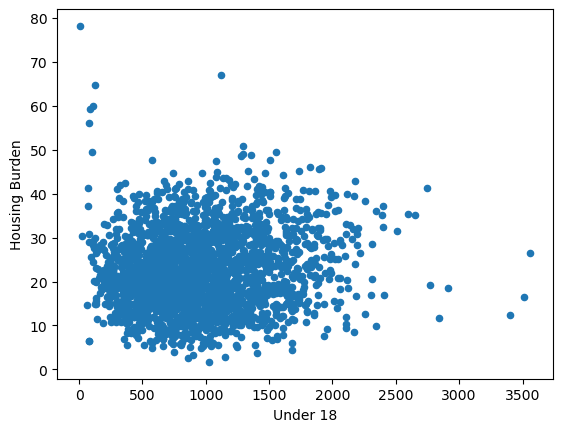

In [92]:
# plot correlation of persons under 18 and housing burden

age_burden_df.plot.scatter(x="Under 18",y="Housing Burden")

<Axes: xlabel='55 and Over', ylabel='Housing Burden'>

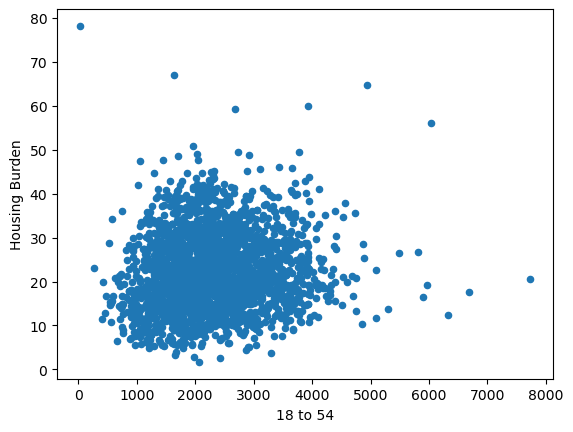

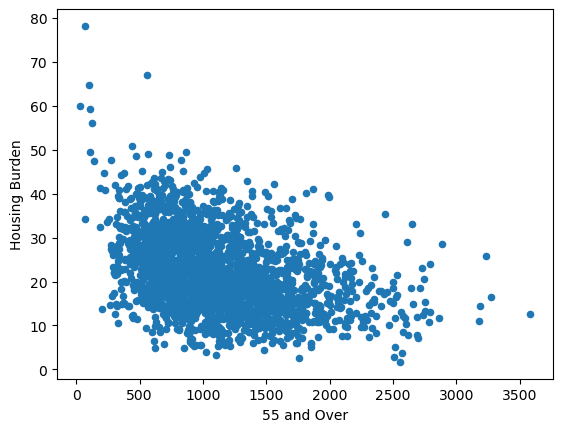

In [93]:
# same for 18-55 and over 55

age_burden_df.plot.scatter(x="18 to 54",y="Housing Burden")
age_burden_df.plot.scatter(x="55 and Over",y="Housing Burden")

#### Age does not seem to be a *significant* factor in determining housing burden.

### 2.3 Housing Unit Type and Housing Burden

In [94]:
# import ACS Housing Unit Type data

htype_df = pd.read_csv(
    '/home/jovyan/UP221_2025Fire_HousingBurden/MIDTERM/data/R13807643_SL140.csv',
    dtype=
    {
        'Geo_FIPS':str,
        'Geo_STATE':str,
        'Geo_COUNTY': str
    }
)

In [95]:
# drop null columns

htype_df = htype_df.dropna(axis=1,how="all")

In [96]:
htype_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2346 entries, 0 to 2345
Data columns (total 35 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   Geo_FIPS           2346 non-null   object 
 1   Geo_GEOID          2346 non-null   object 
 2   Geo_NAME           2346 non-null   object 
 3   Geo_QName          2346 non-null   object 
 4   Geo_STUSAB         2346 non-null   object 
 5   Geo_SUMLEV         2346 non-null   int64  
 6   Geo_GEOCOMP        2346 non-null   int64  
 7   Geo_FILEID         2346 non-null   object 
 8   Geo_LOGRECNO       2346 non-null   int64  
 9   Geo_STATE          2346 non-null   object 
 10  Geo_COUNTY         2346 non-null   object 
 11  Geo_TRACT          2346 non-null   int64  
 12  SE_A10032_001      2346 non-null   int64  
 13  SE_A10032_002      2346 non-null   int64  
 14  SE_A10032_003      2346 non-null   int64  
 15  SE_A10032_004      2346 non-null   int64  
 16  SE_A10032_005      2346 

In [97]:
htype_df.head()

,Geo_FIPS,Geo_GEOID,Geo_NAME,Geo_QName,Geo_STUSAB,Geo_SUMLEV,Geo_GEOCOMP,Geo_FILEID,Geo_LOGRECNO,Geo_STATE,...,PCT_SE_A10032_003,PCT_SE_A10032_004,PCT_SE_A10032_005,PCT_SE_A10032_006,PCT_SE_A10032_007,PCT_SE_A10032_008,PCT_SE_A10032_009,PCT_SE_A10032_010,PCT_SE_A10032_011,PCT_SE_A10032_012
0,6037101110,14000US06037101110,Census Tract 1011.10,"Census Tract 1011.10, Los Angeles County, Cali...",ca,140,0,ACSSF,3871,6,...,66.09,3.03,4.40,7.89,4.23,5.83,5.72,0.00,1.49,1.32
1,6037101122,14000US06037101122,Census Tract 1011.22,"Census Tract 1011.22, Los Angeles County, Cali...",ca,140,0,ACSSF,3872,6,...,100.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00
2,6037101210,14000US06037101210,Census Tract 1012.10,"Census Tract 1012.10, Los Angeles County, Cali...",ca,140,0,ACSSF,3873,6,...,13.29,6.69,2.42,4.31,17.31,35.16,19.61,1.21,0.00,0.00
3,6037101220,14000US06037101220,Census Tract 1012.20,"Census Tract 1012.20, Los Angeles County, Cali...",ca,140,0,ACSSF,3874,6,...,51.81,6.94,0.07,7.15,12.93,11.99,7.01,2.10,0.00,0.00
4,6037101300,14000US06037101300,Census Tract 1013,"Census Tract 1013, Los Angeles County, California",ca,140,0,ACSSF,3875,6,...,92.50,5.87,0.00,0.50,0.00,0.56,0.00,0.00,0.56,0.00


In [98]:
htype_columns_to_keep = ['Geo_FIPS',
                   'SE_A10032_002',
                   'SE_A10032_003',
                   'SE_A10032_004',
                   'SE_A10032_005',
                   'SE_A10032_006',
                   'SE_A10032_007',
                   'SE_A10032_008',
                   'SE_A10032_009',
                   'SE_A10032_010',
                   'SE_A10032_011',
                   'SE_A10032_012']

htype_df2 = htype_df[htype_columns_to_keep]

In [99]:
columns = list(htype_df2)
columns

['Geo_FIPS',
 'SE_A10032_002',
 'SE_A10032_003',
 'SE_A10032_004',
 'SE_A10032_005',
 'SE_A10032_006',
 'SE_A10032_007',
 'SE_A10032_008',
 'SE_A10032_009',
 'SE_A10032_010',
 'SE_A10032_011',
 'SE_A10032_012']

In [100]:
htype_df2.columns = ['Census Tract',
'1 Unit',
'1 Unit: 1 Detached',
'1 Unit: 1 Attached',
'2 Units',
'3 or 4 Units',
'5 to 9 Units',
'10 to 19 Units',
'20 to 49 Units',
'50 or More Units',
'Mobile Home',
'Boat, RV, Van, Etc.']

In [101]:
htype_df2.sample(5)

,Census Tract,1 Unit,1 Unit: 1 Detached,1 Unit: 1 Attached,2 Units,3 or 4 Units,5 to 9 Units,10 to 19 Units,20 to 49 Units,50 or More Units,Mobile Home,"Boat, RV, Van, Etc."
1136,6037403325,1547,1442,105,0,40,13,0,0,99,0,0
1425,6037481605,807,695,112,107,140,39,0,8,0,17,0
416,6037190301,276,193,83,13,75,214,509,986,1081,0,0
324,6037139600,874,799,75,66,28,13,70,458,882,0,0
2101,6037670602,2475,2344,131,0,14,15,30,114,438,0,0


In [102]:
# convert Census Tract data sets to string 

htype_df2["Census Tract"] = htype_df2["Census Tract"].astype(str)

/tmp/ipykernel_294/450749761.py:3: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [103]:
# merge on Census Tract

htype_burden_df = burden_df2.merge(htype_df2, on="Census Tract")

In [104]:
htype_burden_df.sample(5)

,Census Tract,California County,Longitude,Latitude,Housing Burden,1 Unit,1 Unit: 1 Detached,1 Unit: 1 Attached,2 Units,3 or 4 Units,5 to 9 Units,10 to 19 Units,20 to 49 Units,50 or More Units,Mobile Home,"Boat, RV, Van, Etc."
979,6037211122,Los Angeles,-118.289223,34.072679,26.1,145,116,29,5,50,73,199,265,656,0,0
1376,6037910706,Los Angeles,-117.999464,34.553472,16.7,1417,1390,27,0,7,0,0,22,0,137,0
384,6037533805,Los Angeles,-118.175136,33.974423,24.6,586,461,125,77,163,88,26,36,0,0,0
277,6037433401,Los Angeles,-118.042612,34.059602,24.0,511,427,84,57,46,15,96,50,16,11,0
1741,6037186202,Los Angeles,-118.224190,34.120029,12.1,515,470,45,33,11,8,19,146,40,0,0


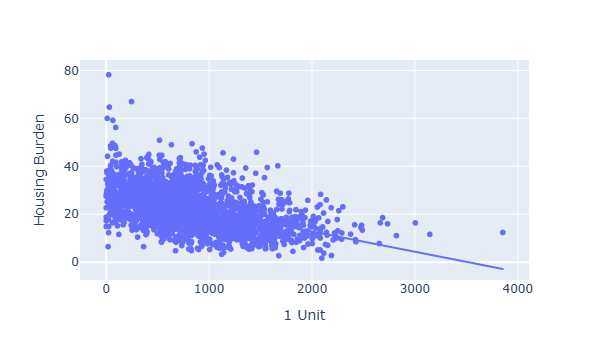

In [105]:
# create scatter plot to show relationship between Housing Burden and "1 Unit"

fig = px.scatter(htype_burden_df, x="1 Unit", y="Housing Burden", trendline="ols")
fig.show()

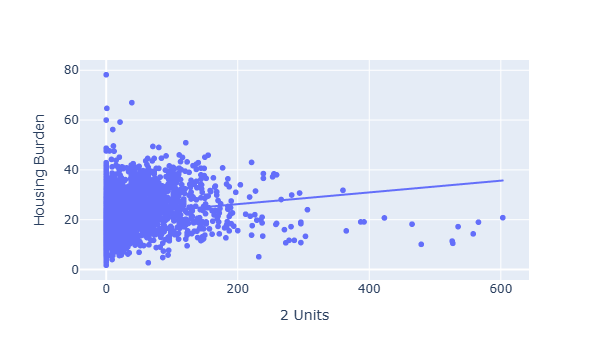

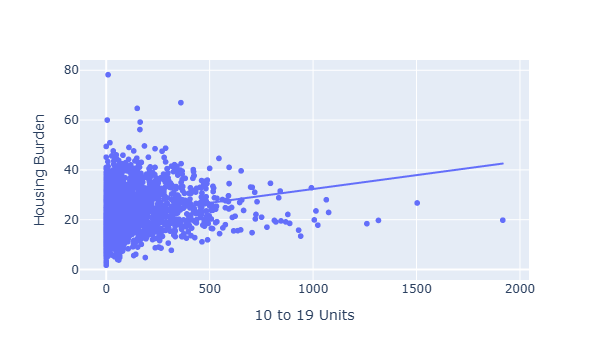

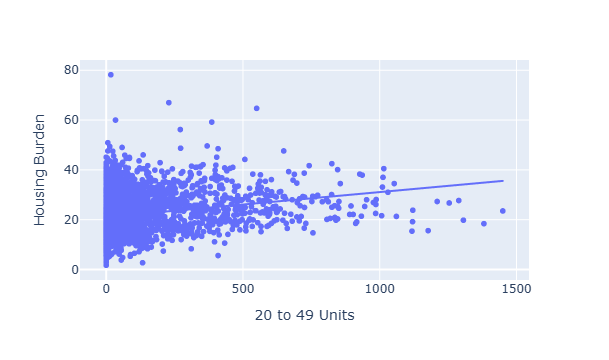

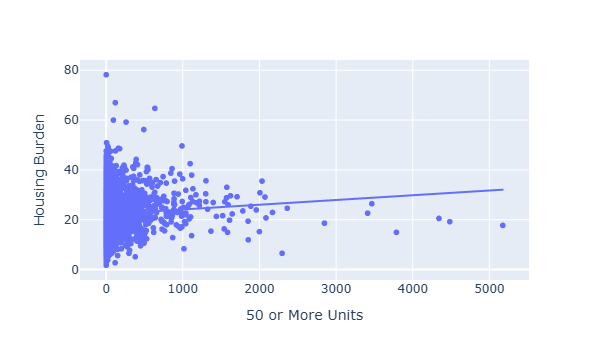

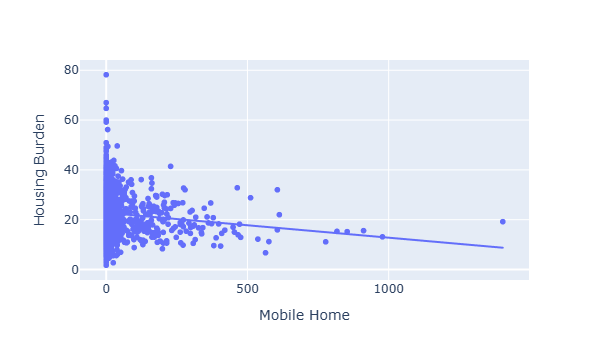

In [106]:
# more scatter plots

fig = px.scatter(htype_burden_df, x="2 Units", y="Housing Burden", trendline="ols")
fig.show()

fig = px.scatter(htype_burden_df, x="10 to 19 Units", y="Housing Burden", trendline="ols")
fig.show()

fig = px.scatter(htype_burden_df, x="20 to 49 Units", y="Housing Burden", trendline="ols")
fig.show()

fig = px.scatter(htype_burden_df, x="50 or More Units", y="Housing Burden", trendline="ols")
fig.show()

fig = px.scatter(htype_burden_df, x="Mobile Home", y="Housing Burden", trendline="ols")
fig.show()

#### "1 Unit" and "Mobile Home" are only housing types with a negative trend line, suggesting that as percentage of these types of homes increase, housing burden tends to decrease. 

### 2.4 Income and Housing Burden

In [107]:
# import additional libraries as needed

import seaborn as sns
import matplotlib.pyplot as plt
import folium

%matplotlib inline

In [109]:
# import data and convert the Geo_FIPS variables as a string

renter_index = pd.read_csv('/home/jovyan/UP221_2025Fire_HousingBurden/MIDTERM/data/acs_15_19_week3.csv',
                          dtype = {'Geo_FIPS':str})

In [110]:
renter_index.shape

(2346, 153)

In [111]:
renter_index.head()

,Geo_FIPS,Geo_NAME,Geo_QName,Geo_STUSAB,Geo_SUMLEV,Geo_GEOCOMP,Geo_FILEID,Geo_LOGRECNO,Geo_US,Geo_REGION,...,ACS19_5yr_B25106037s,ACS19_5yr_B25106038s,ACS19_5yr_B25106039s,ACS19_5yr_B25106040s,ACS19_5yr_B25106041s,ACS19_5yr_B25106042s,ACS19_5yr_B25106043s,ACS19_5yr_B25106044s,ACS19_5yr_B25106045s,ACS19_5yr_B25106046s
0,6037101110,Census Tract 1011.10,"Census Tract 1011.10, Los Angeles County, Cali...",ca,140,0,ACSSF,3871,NaN,NaN,...,31.515150,7.272727,24.848480,21.212120,62.42424,43.636360,40.60606,17.575760,15.757580,13.333330
1,6037101122,Census Tract 1011.22,"Census Tract 1011.22, Los Angeles County, Cali...",ca,140,0,ACSSF,3872,NaN,NaN,...,30.303030,7.272727,7.272727,30.303030,42.42424,7.272727,28.48485,32.727270,7.272727,15.151520
2,6037101210,Census Tract 1012.10,"Census Tract 1012.10, Los Angeles County, Cali...",ca,140,0,ACSSF,3873,NaN,NaN,...,64.848490,27.878790,20.606060,50.303030,90.30303,75.757580,41.81818,35.757580,46.060610,30.303030
3,6037101220,Census Tract 1012.20,"Census Tract 1012.20, Los Angeles County, Cali...",ca,140,0,ACSSF,3874,NaN,NaN,...,26.060610,12.727270,22.424240,12.727270,36.96970,26.060610,24.84848,7.878788,18.181820,7.272727
4,6037101300,Census Tract 1013,"Census Tract 1013, Los Angeles County, California",ca,140,0,ACSSF,3875,NaN,NaN,...,7.272727,7.272727,7.272727,7.272727,33.33333,30.303030,14.54545,10.303030,7.272727,7.878788


In [112]:
# isolating the columns we only need

renter_index_v2 = renter_index[["Geo_FIPS", 
                                "Geo_NAME", 
                                "ACS19_5yr_B25058001", 
                                "ACS19_5yr_B25105001",
                                "ACS19_5yr_B25106024",
                                "ACS19_5yr_B25106028", 
                                "ACS19_5yr_B25106032", 
                                "ACS19_5yr_B25106036", 
                                "ACS19_5yr_B25106040"]]

In [113]:
# renaming the new version of our data frame

renter_index_v2.columns = ['Census Tract', 
                           'Census Tract #', 
                           'Median Contract Rent', 
                           'Median Monthly Housing Costs',
                           'Total Renter Housing Units',
                           'less than $20,000', 
                           '20,000 to 34,999', 
                           '35,000 To 49,999', 
                           '50,000 To 74,999']

In [114]:
# ensuring we have the correct data types

renter_index_v2.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2346 entries, 0 to 2345
Data columns (total 9 columns):
 #   Column                        Non-Null Count  Dtype  
---  ------                        --------------  -----  
 0   Census Tract                  2346 non-null   object 
 1   Census Tract #                2346 non-null   object 
 2   Median Contract Rent          2289 non-null   float64
 3   Median Monthly Housing Costs  2310 non-null   float64
 4   Total Renter Housing Units    2346 non-null   int64  
 5   less than $20,000             2346 non-null   int64  
 6   20,000 to 34,999              2346 non-null   int64  
 7   35,000 To 49,999              2346 non-null   int64  
 8   50,000 To 74,999              2346 non-null   int64  
dtypes: float64(2), int64(5), object(2)
memory usage: 165.1+ KB


In [115]:
# making a copy of the existing data frame

renter_index_v3 = renter_index_v2.copy()

# creating four new variables 

renter_index_v3['less than 20,000 proportion'] = renter_index_v3['less than $20,000'] / renter_index_v3['Total Renter Housing Units']
renter_index_v3['20,000 to 34,999 proportion'] = renter_index_v3['20,000 to 34,999'] / renter_index_v3['Total Renter Housing Units']
renter_index_v3['35,000 To 49,999 proportion'] = renter_index_v3['35,000 To 49,999'] / renter_index_v3['Total Renter Housing Units']
renter_index_v3['50,000 To 74,999 proportion'] = renter_index_v3['50,000 To 74,999'] / renter_index_v3['Total Renter Housing Units']

renter_index_v3.head()

,Census Tract,Census Tract #,Median Contract Rent,Median Monthly Housing Costs,Total Renter Housing Units,"less than $20,000","20,000 to 34,999","35,000 To 49,999","50,000 To 74,999","less than 20,000 proportion","20,000 to 34,999 proportion","35,000 To 49,999 proportion","50,000 To 74,999 proportion"
0,6037101110,Census Tract 1011.10,1468.0,1853.0,732,147,103,104,53,0.200820,0.140710,0.142077,0.072404
1,6037101122,Census Tract 1011.22,2067.0,2273.0,240,22,27,34,39,0.091667,0.112500,0.141667,0.162500
2,6037101210,Census Tract 1012.10,1276.0,1494.0,1896,545,266,223,160,0.287447,0.140295,0.117616,0.084388
3,6037101220,Census Tract 1012.20,1086.0,1361.0,822,262,114,161,19,0.318735,0.138686,0.195864,0.023114
4,6037101300,Census Tract 1013,2209.0,2094.0,190,9,33,25,8,0.047368,0.173684,0.131579,0.042105


In [116]:
# merge on Census Tract

renter_index_burden_df = burden_df2.merge(renter_index_v3, on="Census Tract")

In [117]:
renter_index_burden_df.head()

,Census Tract,California County,Longitude,Latitude,Housing Burden,Census Tract #,Median Contract Rent,Median Monthly Housing Costs,Total Renter Housing Units,"less than $20,000","20,000 to 34,999","35,000 To 49,999","50,000 To 74,999","less than 20,000 proportion","20,000 to 34,999 proportion","35,000 To 49,999 proportion","50,000 To 74,999 proportion"
0,6037204920,Los Angeles,-118.197497,34.017500,20.3,Census Tract 2049.20,880.0,1092.0,386,87,103,36,0,0.225389,0.266839,0.093264,0.000000
1,6037542402,Los Angeles,-118.212413,33.881969,23.7,Census Tract 5424.02,980.0,1560.0,220,16,28,33,20,0.072727,0.127273,0.150000,0.090909
2,6037543202,Los Angeles,-118.230032,33.879862,29.6,Census Tract 5432.02,1293.0,1291.0,612,170,90,63,35,0.277778,0.147059,0.102941,0.057190
3,6037203300,Los Angeles,-118.207788,34.058872,28.3,Census Tract 2033,967.0,1186.0,358,103,77,65,8,0.287709,0.215084,0.181564,0.022346
4,6037291220,Los Angeles,-118.286709,33.877139,26.1,Census Tract 2912.20,1144.0,1385.0,635,135,154,35,76,0.212598,0.242520,0.055118,0.119685


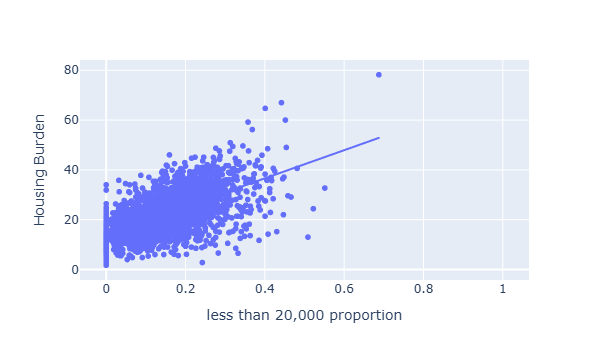

In [118]:
# create scatter plot to show relationship between Housing Burden and "1 Unit"

fig = px.scatter(renter_index_burden_df, x="less than 20,000 proportion", y="Housing Burden", trendline="ols")
fig.show()

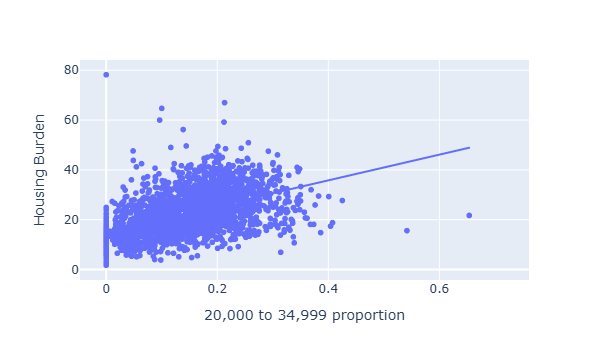

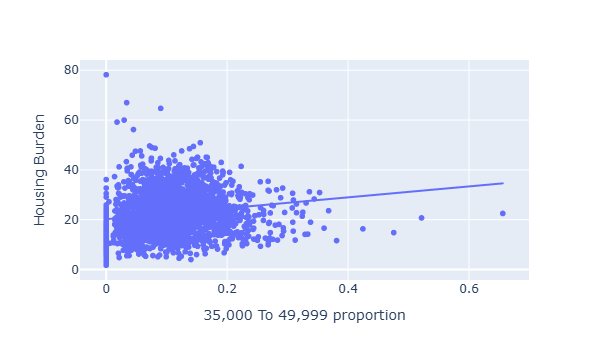

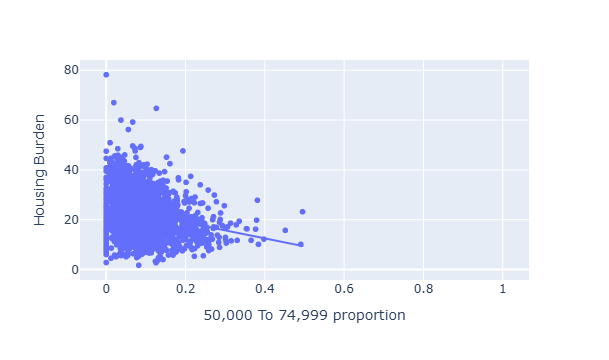

In [119]:
# scatter plots for the rest of the proportions

fig = px.scatter(renter_index_burden_df, x="20,000 to 34,999 proportion", y="Housing Burden", trendline="ols")
fig.show()

fig = px.scatter(renter_index_burden_df, x="35,000 To 49,999 proportion", y="Housing Burden", trendline="ols")
fig.show()

fig = px.scatter(renter_index_burden_df, x="50,000 To 74,999 proportion", y="Housing Burden", trendline="ols")
fig.show()

#### We see that the plot shows a positive, linear, moderate relationship between housing burden index and proportion of renters who allocate 30% or more of their household income to renting costs, under the less than $20,000 income bracket. What is interesting to see is that as income increases, the relationship becomes weaker. Higher housing burden is typically associated with lower proportion of tracts where renters allocate 30% or more of their household income to rent.

## 3. Price Gouging in Los Angeles
### Where is rental price gouging happening in LA?

In [61]:
!pip install folium numpy pandas

In [63]:
# import additional libraries for heatmap

import folium
import pandas as pd
import numpy as np
from folium.plugins import HeatMap